# Fusion Pipeline Analysis

End-to-end analysis of a trained Fusion checkpoint (frozen LeJEPA encoder + conditioned JiT decoder).

Covers:
- Training / validation loss curves
- Encoder embedding analysis (PCA, patch heatmaps, nearest neighbors)
- Conditioned vs unconditioned sample generation
- Animated x-prediction process

Set `CHECKPOINT_PATH` below to point at your Fusion checkpoint.

In [10]:
#CHECKPOINT_PATH = "../checkpoints/<run_id>/fusion_last.pth"  # <-- edit this

CHECKPOINT_PATH = "../checkpoints/fusion_f572fa45/fusion_epoch_350.pth"

In [11]:
from pathlib import Path

import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np
import torch
from IPython.display import HTML
from PIL import Image
from sklearn.decomposition import PCA
from torch.utils.data import DataLoader, Subset

from jepajitfusion.config import DataConfig, EncoderConfig
from jepajitfusion.config.decoder_config import DecoderConfig
from jepajitfusion.data.datasets import get_dataset
from jepajitfusion.data.transforms import eval_transform, reverse_transform
from jepajitfusion.decoder.jit_model import JiTModel
from jepajitfusion.decoder.sampler import HeunSampler
from jepajitfusion.encoder.vit import VisionTransformer
from jepajitfusion.utils import get_device

## Load checkpoint and build models

In [12]:
device = get_device()
checkpoint = torch.load(CHECKPOINT_PATH, map_location="cpu", weights_only=False)

print(f"Checkpoint keys: {list(checkpoint.keys())}")
print(f"Epoch: {checkpoint['epoch']}")
print(f"Run ID: {checkpoint.get('run_id', 'N/A')}")

Checkpoint keys: ['epoch', 'run_id', 'model_state_dict', 'encoder_state_dict', 'ema_state_dicts', 'optimizer_state_dict', 'decoder_config', 'dataset_config', 'encoder_config', 'train_losses', 'val_losses']
Epoch: 349
Run ID: fusion_f572fa45


In [13]:
dec_cfg = DecoderConfig(**checkpoint["decoder_config"]) if "decoder_config" in checkpoint else DecoderConfig()
ds_cfg = DataConfig(**checkpoint["dataset_config"]) if "dataset_config" in checkpoint else DataConfig()
enc_cfg = EncoderConfig(**checkpoint["encoder_config"]) if "encoder_config" in checkpoint else EncoderConfig()

print(f"Encoder: embed_dim={enc_cfg.embed_dim}, depth={enc_cfg.depth}, heads={enc_cfg.num_heads}")
print(f"Decoder: dim={dec_cfg.dim}, depth={dec_cfg.depth}, heads={dec_cfg.num_heads}")
print(f"Dataset: {ds_cfg.name}, img_size={ds_cfg.img_size}")

Encoder: embed_dim=256, depth=6, heads=4
Decoder: dim=384, depth=8, heads=6
Dataset: pokemon_11k, img_size=96


In [14]:
# Build encoder
encoder = VisionTransformer(
    img_size=ds_cfg.img_size,
    patch_size=enc_cfg.patch_size,
    in_channels=ds_cfg.num_channels,
    embed_dim=enc_cfg.embed_dim,
    depth=enc_cfg.depth,
    num_heads=enc_cfg.num_heads,
    mlp_ratio=enc_cfg.mlp_ratio,
)
encoder.load_state_dict(checkpoint["encoder_state_dict"])
encoder = encoder.to(device)
encoder.eval()

# Build decoder
decoder = JiTModel(
    img_size=ds_cfg.img_size,
    patch_size=dec_cfg.patch_size,
    in_channels=ds_cfg.num_channels,
    dim=dec_cfg.dim,
    depth=dec_cfg.depth,
    num_heads=dec_cfg.num_heads,
    mlp_ratio=dec_cfg.mlp_ratio,
    bottleneck_dim=dec_cfg.bottleneck_dim,
    conditioning_mode="jepa",
    jepa_dim=enc_cfg.embed_dim,
)
# Prefer EMA weights
if "ema_state_dicts" in checkpoint and checkpoint["ema_state_dicts"]:
    decoder.load_state_dict(checkpoint["ema_state_dicts"][0])
    print("Loaded EMA decoder weights")
else:
    decoder.load_state_dict(checkpoint["model_state_dict"])
    print("Loaded decoder weights")
decoder = decoder.to(device)
decoder.eval()

enc_params = sum(p.numel() for p in encoder.parameters()) / 1e6
dec_params = sum(p.numel() for p in decoder.parameters()) / 1e6
print(f"Encoder: {enc_params:.1f}M params | Decoder: {dec_params:.1f}M params | Device: {device}")

JiT model: 22.1M parameters, mode=jepa
Loaded EMA decoder weights
Encoder: 4.8M params | Decoder: 22.1M params | Device: cuda


## Training and validation loss curves

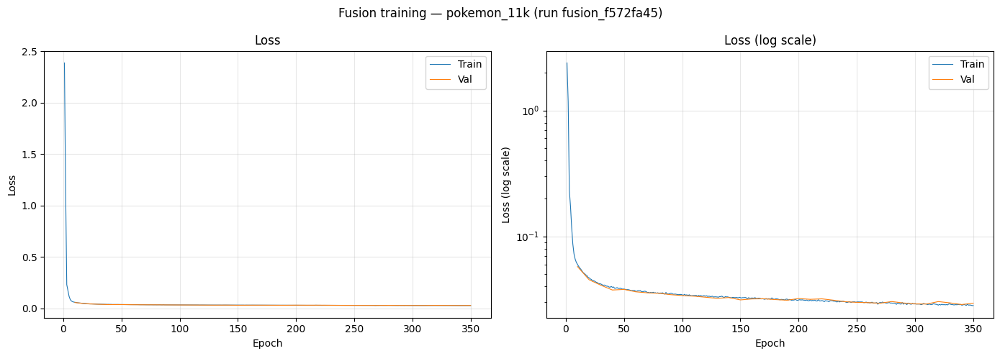

Final train loss: 0.028245 (epoch 350)
Min train loss:   0.028228 (epoch 349)
Min val loss:     0.028754


In [15]:
train_losses = checkpoint.get("train_losses")
val_losses = checkpoint.get("val_losses")

if train_losses:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    epochs = range(1, len(train_losses) + 1)
    ax1.plot(epochs, train_losses, linewidth=0.8, label="Train")
    if val_losses:
        val_interval = max(1, len(train_losses) // len(val_losses))
        val_epochs = [val_interval * (i + 1) for i in range(len(val_losses))]
        ax1.plot(val_epochs, val_losses, linewidth=0.8, label="Val")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.set_title("Loss")
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    ax2.plot(epochs, train_losses, linewidth=0.8, label="Train")
    if val_losses:
        ax2.plot(val_epochs, val_losses, linewidth=0.8, label="Val")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Loss (log scale)")
    ax2.set_title("Loss (log scale)")
    ax2.set_yscale("log")
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    fig.suptitle(
        f"Fusion training \u2014 {ds_cfg.name} (run {checkpoint.get('run_id', 'N/A')})",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()

    print(f"Final train loss: {train_losses[-1]:.6f} (epoch {len(train_losses)})")
    print(f"Min train loss:   {min(train_losses):.6f} (epoch {train_losses.index(min(train_losses)) + 1})")
    if val_losses:
        print(f"Min val loss:     {min(val_losses):.6f}")
else:
    print("No train_losses in checkpoint. Re-train to get loss curves.")

## Load dataset

In [16]:
MAX_IMAGES = 2000
BATCH_SIZE = 128

transform = eval_transform(ds_cfg.img_size)
train_ds, test_ds = get_dataset(
    ds_cfg.name, transform=transform, data_dir="../downloads", test_size=ds_cfg.test_size
)

dataset = test_ds
n_images = min(len(dataset), MAX_IMAGES)
print(f"Using {n_images} images from {ds_cfg.name} test set")

Found existing train/test dirs in ../downloads/pokemon_11k
Using 1766 images from pokemon_11k test set


## Encoder embedding analysis

Encode the test set through the frozen encoder and analyze the embedding space.

In [17]:
subset = Subset(dataset, range(n_images))
loader = DataLoader(subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

all_embeddings = []
all_labels = []

with torch.no_grad():
    for images, labels in loader:
        images = images.to(device)
        emb = encoder(images)
        all_embeddings.append(emb.cpu())
        all_labels.append(labels)

embeddings = torch.cat(all_embeddings, dim=0).numpy()
labels = torch.cat(all_labels, dim=0).numpy()

print(f"Embeddings shape: {embeddings.shape}")
print(f"Unique labels: {len(np.unique(labels))}")

Embeddings shape: (1766, 256)
Unique labels: 1


### PCA projection

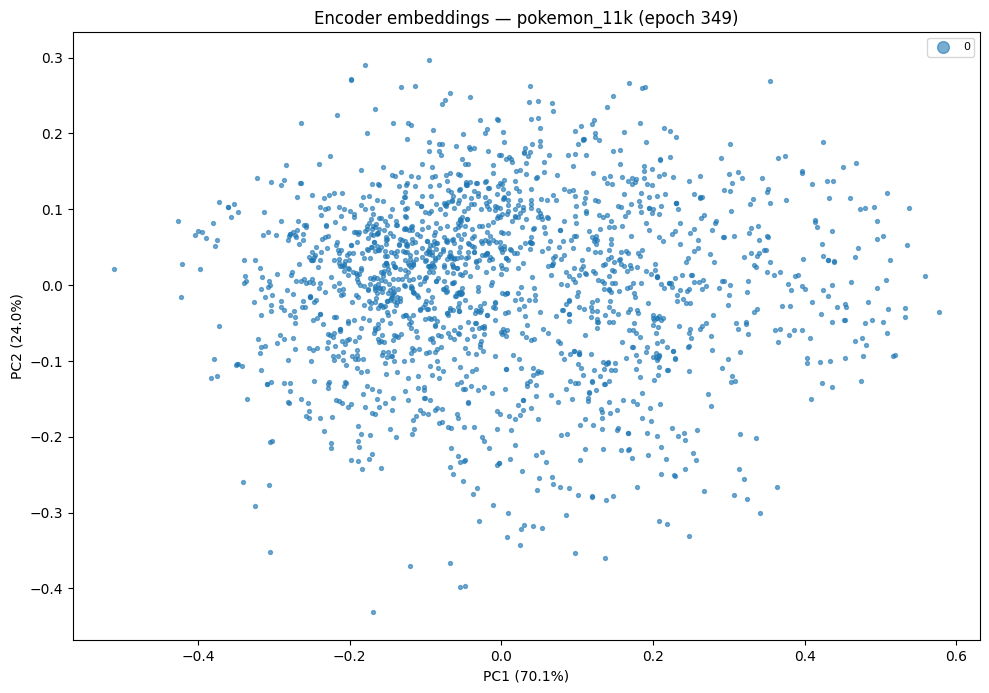

Explained variance: PC1=70.1%, PC2=24.0%


In [18]:
pca = PCA(n_components=2)
proj_2d = pca.fit_transform(embeddings)

fig, ax = plt.subplots(figsize=(10, 8))

unique_labels = np.unique(labels)
if len(unique_labels) <= 20:
    for label in unique_labels:
        mask = labels == label
        ax.scatter(proj_2d[mask, 0], proj_2d[mask, 1], s=8, alpha=0.6, label=str(label))
    ax.legend(markerscale=3, fontsize=8)
else:
    ax.scatter(proj_2d[:, 0], proj_2d[:, 1], s=8, alpha=0.4, c=labels, cmap="tab20")

ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%})")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%})")
ax.set_title(f"Encoder embeddings \u2014 {ds_cfg.name} (epoch {checkpoint['epoch']})")
ax.set_aspect("equal")
plt.tight_layout()
plt.show()

print(f"Explained variance: PC1={pca.explained_variance_ratio_[0]:.1%}, PC2={pca.explained_variance_ratio_[1]:.1%}")

### Explained variance spectrum

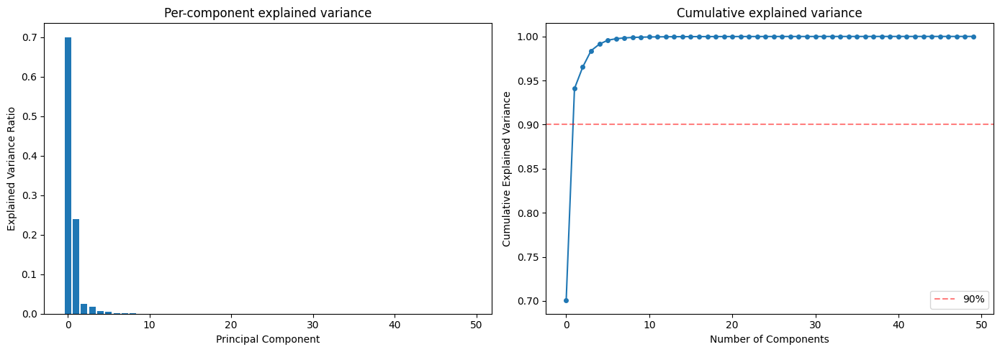

Components for 90% variance: 2 / 256


In [19]:
pca_full = PCA(n_components=min(50, embeddings.shape[1]))
pca_full.fit(embeddings)

cumulative = np.cumsum(pca_full.explained_variance_ratio_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.bar(range(len(pca_full.explained_variance_ratio_)), pca_full.explained_variance_ratio_)
ax1.set_xlabel("Principal Component")
ax1.set_ylabel("Explained Variance Ratio")
ax1.set_title("Per-component explained variance")

ax2.plot(range(len(cumulative)), cumulative, "o-", markersize=4)
ax2.axhline(y=0.9, color="r", linestyle="--", alpha=0.5, label="90%")
ax2.set_xlabel("Number of Components")
ax2.set_ylabel("Cumulative Explained Variance")
ax2.set_title("Cumulative explained variance")
ax2.legend()

plt.tight_layout()
plt.show()

n_90 = np.searchsorted(cumulative, 0.9) + 1
print(f"Components for 90% variance: {n_90} / {embeddings.shape[1]}")

### Patch-level PCA heatmaps

In [20]:
PCA_IMAGES = 500
N_PCS = 3

patch_h = ds_cfg.img_size // enc_cfg.patch_size
patch_w = ds_cfg.img_size // enc_cfg.patch_size
print(f"Patch grid: {patch_h}x{patch_w} = {patch_h * patch_w} tokens per image")

pca_subset = Subset(dataset, range(min(len(dataset), PCA_IMAGES)))
pca_loader = DataLoader(pca_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

all_patch_tokens = []
with torch.no_grad():
    for images, _ in pca_loader:
        images = images.to(device)
        tokens = encoder(images, return_all_tokens=True)
        patch_tokens = tokens[:, 1:, :]
        all_patch_tokens.append(patch_tokens.cpu())

all_patch_tokens = torch.cat(all_patch_tokens, dim=0)
n_imgs = all_patch_tokens.shape[0]

flat_patches = all_patch_tokens.reshape(-1, all_patch_tokens.shape[-1]).numpy()
patch_pca = PCA(n_components=N_PCS)
patch_pca.fit(flat_patches)

print(f"Patch PCA explained variance: {[f'{v:.1%}' for v in patch_pca.explained_variance_ratio_]}")
print(f"Fit on {flat_patches.shape[0]} patch tokens from {n_imgs} images")

Patch grid: 12x12 = 144 tokens per image
Patch PCA explained variance: ['46.7%', '27.2%', '13.1%']
Fit on 72000 patch tokens from 500 images


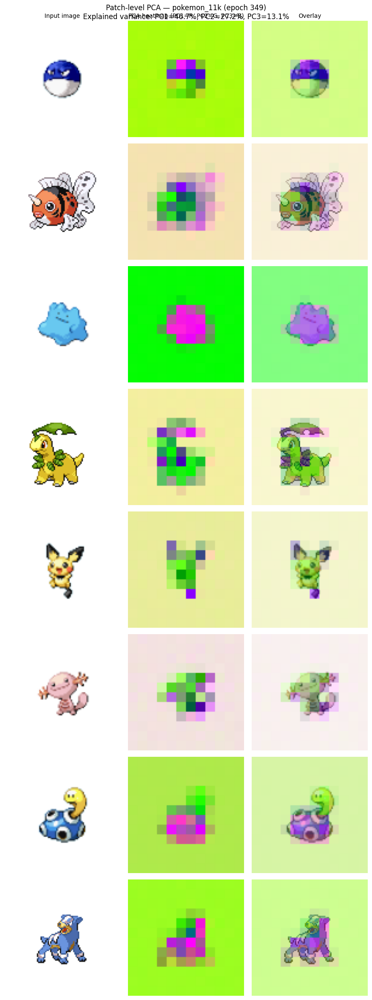

In [21]:
rev_t = reverse_transform()


def patch_pca_heatmap(img_patch_tokens, pca_model, patch_h, patch_w, img_size):
    """Project patch tokens through PCA and return an upsampled RGB image."""
    projected = pca_model.transform(img_patch_tokens)
    spatial = projected.reshape(patch_h, patch_w, 3)
    for c in range(3):
        ch = spatial[:, :, c]
        lo, hi = ch.min(), ch.max()
        spatial[:, :, c] = (ch - lo) / (hi - lo + 1e-8)
    heatmap_pil = Image.fromarray((spatial * 255).astype(np.uint8), mode="RGB")
    heatmap_pil = heatmap_pil.resize((img_size, img_size), Image.NEAREST)
    return np.array(heatmap_pil).astype(np.float32) / 255.0


N_DISPLAY = 8
display_idxs = np.linspace(0, min(n_imgs, len(pca_subset)) - 1, N_DISPLAY, dtype=int)

fig, axes = plt.subplots(N_DISPLAY, 3, figsize=(9, 3 * N_DISPLAY))
col_titles = ["Input image", "PCA heatmap (PC1=R, PC2=G, PC3=B)", "Overlay"]

for row, idx in enumerate(display_idxs):
    img_tensor, _ = pca_subset[idx]
    orig_pil = rev_t(img_tensor)
    orig_np = np.array(orig_pil).astype(np.float32) / 255.0

    tokens_np = all_patch_tokens[idx].numpy()
    heatmap = patch_pca_heatmap(tokens_np, patch_pca, patch_h, patch_w, ds_cfg.img_size)

    overlay = 0.5 * orig_np + 0.5 * heatmap

    for col, img in enumerate([orig_np, heatmap, overlay]):
        axes[row, col].imshow(img)
        axes[row, col].axis("off")
        if row == 0:
            axes[row, col].set_title(col_titles[col], fontsize=10)

fig.suptitle(
    f"Patch-level PCA \u2014 {ds_cfg.name} (epoch {checkpoint['epoch']})\n"
    f"Explained variance: {', '.join(f'PC{i+1}={v:.1%}' for i, v in enumerate(patch_pca.explained_variance_ratio_))}",
    fontsize=12,
)
plt.tight_layout()
plt.show()

### Nearest neighbors in embedding space

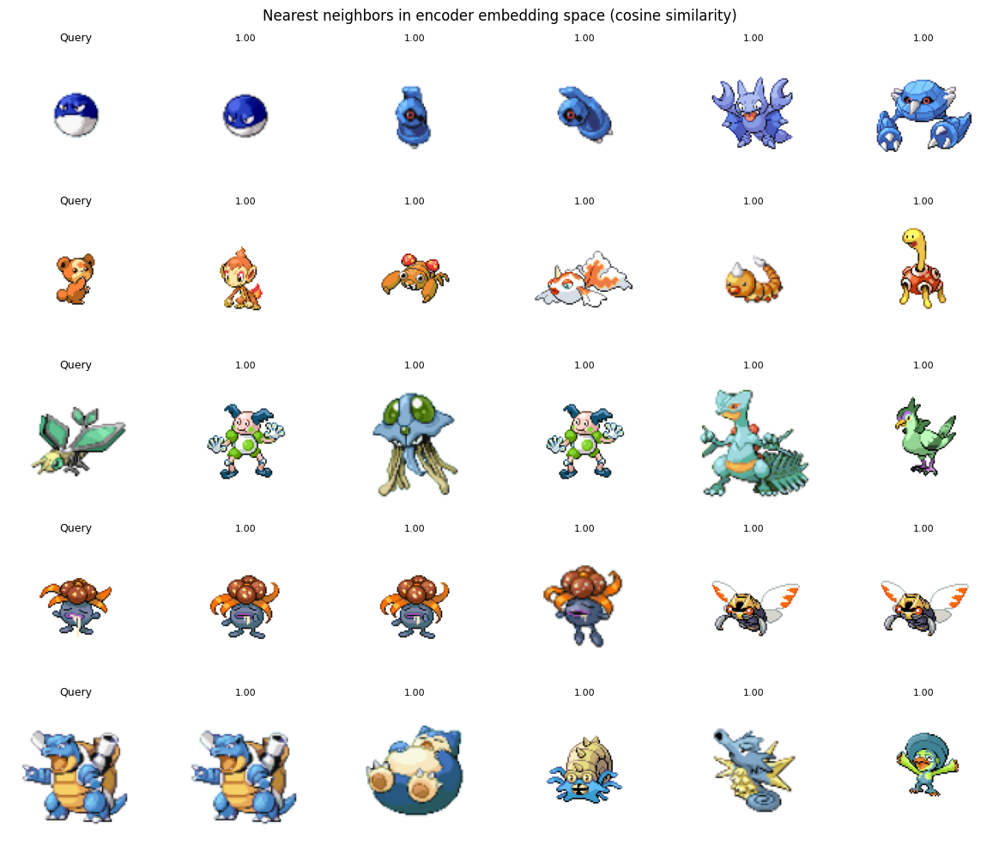

In [22]:
N_QUERIES = 5
N_NEIGHBORS = 5

emb_norm = embeddings / (np.linalg.norm(embeddings, axis=1, keepdims=True) + 1e-8)
sim = emb_norm @ emb_norm.T

query_idxs = np.linspace(0, n_images - 1, N_QUERIES, dtype=int)

fig, axes = plt.subplots(N_QUERIES, N_NEIGHBORS + 1, figsize=(2 * (N_NEIGHBORS + 1), 2 * N_QUERIES))

for row, qi in enumerate(query_idxs):
    img_tensor, _ = subset[qi]
    axes[row, 0].imshow(rev_t(img_tensor))
    axes[row, 0].set_title("Query", fontsize=9)
    axes[row, 0].axis("off")

    neighbors = np.argsort(-sim[qi])
    col = 1
    for ni in neighbors:
        if ni == qi:
            continue
        img_tensor, _ = subset[int(ni)]
        axes[row, col].imshow(rev_t(img_tensor))
        axes[row, col].set_title(f"{sim[qi, ni]:.2f}", fontsize=8)
        axes[row, col].axis("off")
        col += 1
        if col > N_NEIGHBORS:
            break

fig.suptitle("Nearest neighbors in encoder embedding space (cosine similarity)", fontsize=12)
plt.tight_layout()
plt.show()

## Conditioned sample generation

Feed real images through the frozen encoder to get JEPA embeddings, then
generate conditioned samples. The input images are shown alongside the
generations so we can judge how well the decoder uses the conditioning.

In [23]:
N_SAMPLES = 8
NUM_STEPS = 50
NOISE_SCALE = 0.375
CFG_SCALE = 1.5
SEED = 1999

In [24]:
sampler = HeunSampler(num_steps=NUM_STEPS, cfg_scale=CFG_SCALE, noise_scale=NOISE_SCALE)
shape = (N_SAMPLES, ds_cfg.num_channels, ds_cfg.img_size, ds_cfg.img_size)

# Pick reference images from the test set
ref_images = []
for i in range(N_SAMPLES):
    img_tensor, _ = dataset[i]
    ref_images.append(img_tensor)
ref_batch = torch.stack(ref_images).to(device)

# Encode to get JEPA conditioning
with torch.no_grad():
    jepa_emb = encoder(ref_batch)

print(f"JEPA embeddings: {jepa_emb.shape}")

# Conditioned generation
torch.manual_seed(SEED)
print(f"Generating {N_SAMPLES} conditioned samples...")
cond_samples = sampler.sample(decoder, shape, device, conditioning=jepa_emb)

# Unconditioned generation (same seed for comparison)
torch.manual_seed(SEED)
print(f"Generating {N_SAMPLES} unconditioned samples...")
uncond_samples = sampler.sample(decoder, shape, device)

print("Done.")

JEPA embeddings: torch.Size([8, 256])
Generating 8 conditioned samples...
Generating 8 unconditioned samples...
Done.


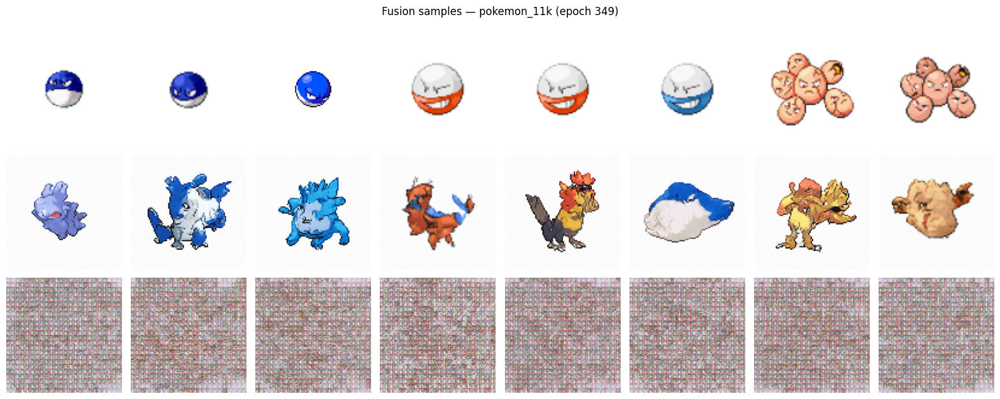

In [25]:
fig, axes = plt.subplots(3, N_SAMPLES, figsize=(2 * N_SAMPLES, 6.5))
row_labels = ["Input (conditioning)", "Conditioned", "Unconditioned"]

for i in range(N_SAMPLES):
    axes[0, i].imshow(rev_t(ref_batch[i].cpu()))
    axes[1, i].imshow(rev_t(cond_samples[i].cpu()))
    axes[2, i].imshow(rev_t(uncond_samples[i].cpu()))
    for row in range(3):
        axes[row, i].axis("off")

for row, label in enumerate(row_labels):
    axes[row, 0].set_ylabel(label, fontsize=10, rotation=0, labelpad=80, va="center")

fig.suptitle(
    f"Fusion samples \u2014 {ds_cfg.name} (epoch {checkpoint['epoch']})",
    fontsize=12,
)
plt.tight_layout()
plt.show()

## Animated x-prediction process (conditioned)

Capture the decoder's x-prediction $\hat{x}$ at each Heun step,
conditioned on JEPA embeddings from real images.

In [26]:
GIF_SAMPLES = 8
GIF_STEPS = 50
SAVE_EVERY_K = 2
GIF_SEED = 42

In [27]:
@torch.no_grad()
def sample_with_x_predictions(
    model,
    shape,
    device,
    num_steps=50,
    noise_scale=0.375,
    cfg_scale=1.5,
    conditioning=None,
    uncond_conditioning=None,
    save_every_k=1,
):
    """Heun sampling that also returns intermediate x-predictions."""
    z = torch.randn(shape, device=device) * noise_scale
    x_preds = []
    timesteps = []

    for i in range(num_steps):
        t_val = i / num_steps
        t_next_val = (i + 1) / num_steps
        dt = t_next_val - t_val

        t = torch.full((shape[0],), t_val, device=device)
        t_next = torch.full((shape[0],), t_next_val, device=device)

        x_pred = model(z, t, conditioning)
        t_view = t.view(-1, 1, 1, 1)
        denom = (1 - t_view).clamp(min=0.05)
        v = (x_pred - z) / denom

        if cfg_scale > 1.0 and uncond_conditioning is not None:
            x_pred_uncond = model(z, t, uncond_conditioning)
            v_uncond = (x_pred_uncond - z) / denom
            v = v_uncond + cfg_scale * (v - v_uncond)
            x_pred = z + v * denom

        if i % save_every_k == 0 or i == num_steps - 1:
            x_preds.append(x_pred.cpu())
            timesteps.append(t_val)

        z_euler = z + dt * v

        if i < num_steps - 1:
            x_pred_next = model(z_euler, t_next, conditioning)
            v_next = (x_pred_next - z_euler) / (1 - t_next.view(-1, 1, 1, 1)).clamp(min=0.05)
            if cfg_scale > 1.0 and uncond_conditioning is not None:
                x_pred_uncond_next = model(z_euler, t_next, uncond_conditioning)
                denom_next = (1 - t_next.view(-1, 1, 1, 1)).clamp(min=0.05)
                v_uncond_next = (x_pred_uncond_next - z_euler) / denom_next
                v_next = v_uncond_next + cfg_scale * (v_next - v_uncond_next)
            v_avg = 0.5 * (v + v_next)
            z = z + dt * v_avg
        else:
            z = z_euler

    return z, x_preds, timesteps

In [28]:
# Use the same reference images for conditioning
gif_ref = []
for i in range(GIF_SAMPLES):
    img_tensor, _ = dataset[i]
    gif_ref.append(img_tensor)
gif_ref_batch = torch.stack(gif_ref).to(device)

with torch.no_grad():
    gif_jepa_emb = encoder(gif_ref_batch)

torch.manual_seed(GIF_SEED)
gif_shape = (GIF_SAMPLES, ds_cfg.num_channels, ds_cfg.img_size, ds_cfg.img_size)

print(f"Generating {GIF_SAMPLES} conditioned samples with {GIF_STEPS} steps, capturing every {SAVE_EVERY_K}...")
final, x_preds, timesteps = sample_with_x_predictions(
    decoder, gif_shape, device,
    num_steps=GIF_STEPS,
    noise_scale=NOISE_SCALE,
    cfg_scale=CFG_SCALE,
    conditioning=gif_jepa_emb,
    save_every_k=SAVE_EVERY_K,
)
print(f"Captured {len(x_preds)} frames")

Generating 8 conditioned samples with 50 steps, capturing every 2...
Captured 26 frames


In [29]:
def combine_images(images, rows, cols):
    """Tile PIL images into a single grid."""
    w, h = images[0].size
    grid = Image.new("RGB", (cols * w, rows * h))
    for i, img in enumerate(images):
        grid.paste(img, ((i % cols) * w, (i // cols) * h))
    return grid


gif_cols = min(8, GIF_SAMPLES)
gif_rows = (GIF_SAMPLES + gif_cols - 1) // gif_cols
scale = max(1, 256 // ds_cfg.img_size)

frames = []
for x_pred in x_preds:
    pil_images = [rev_t(x_pred[i]) for i in range(GIF_SAMPLES)]
    grid = combine_images(pil_images, gif_rows, gif_cols)
    if scale > 1:
        grid = grid.resize((grid.width * scale, grid.height * scale), Image.NEAREST)
    frames.append(grid)

print(f"Built {len(frames)} grid frames ({frames[0].size[0]}x{frames[0].size[1]} px)")

Built 26 grid frames (1536x192 px)


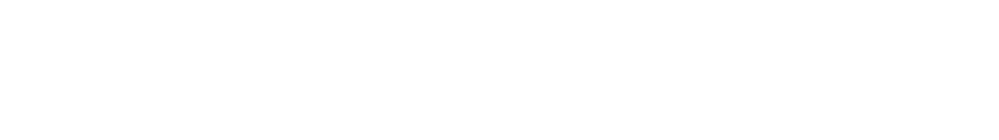

In [30]:
fig = plt.figure(
    figsize=(frames[0].size[0] / 100, frames[0].size[1] / 100), dpi=100
)
ax = plt.gca()
ax.axis("off")

ims = []
for i, frame in enumerate(frames):
    title = ax.text(
        0.5, 1.02, f"t = {timesteps[i]:.2f}",
        ha="center", va="bottom", transform=ax.transAxes, fontsize=12,
    )
    im = plt.imshow(frame)
    ims.append([im, title])

ani = animation.ArtistAnimation(
    fig, ims, interval=200, repeat_delay=3000, repeat=True
)
plt.tight_layout()

In [31]:
# Save gif
output_dir = Path("../samples")
output_dir.mkdir(exist_ok=True, parents=True)

gif_path = output_dir / f"fusion_x_prediction_{ds_cfg.name}.gif"
ani.save(str(gif_path), writer="pillow", fps=5)
print(f"Saved gif to {gif_path}")

Saved gif to ../samples/fusion_x_prediction_pokemon_11k.gif


In [32]:
plt.rcParams["animation.embed_limit"] = 100
HTML(ani.to_jshtml(default_mode="once"))

## x-prediction filmstrip

For each conditioning input, show the decoder's x-prediction at evenly-spaced
timesteps with the input image on the left for reference.

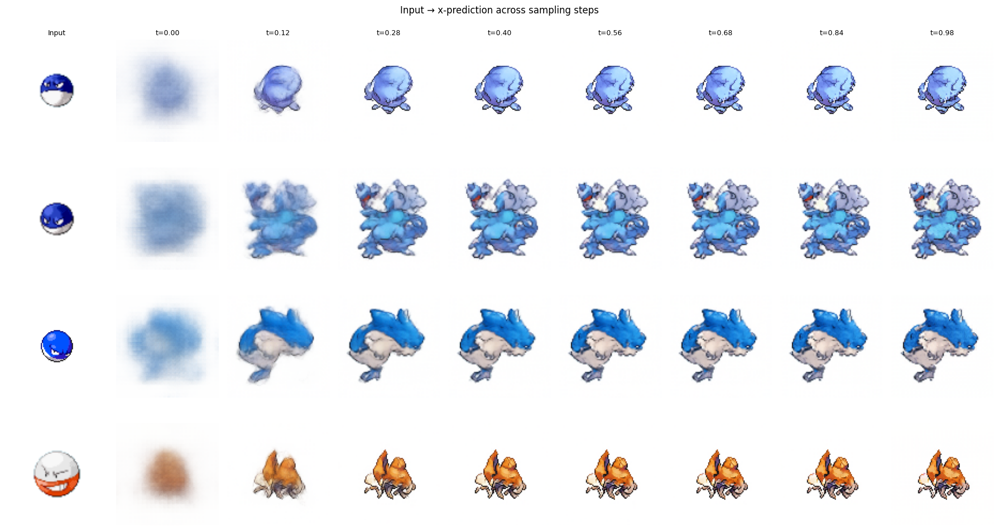

In [33]:
n_filmstrip = min(8, len(x_preds))
filmstrip_idxs = np.linspace(0, len(x_preds) - 1, n_filmstrip, dtype=int)
n_show = min(4, GIF_SAMPLES)  # number of samples to show

fig, axes = plt.subplots(n_show, n_filmstrip + 1, figsize=(2 * (n_filmstrip + 1), 2.5 * n_show))

for row in range(n_show):
    # Input image in first column
    axes[row, 0].imshow(rev_t(gif_ref_batch[row].cpu()))
    axes[row, 0].axis("off")
    if row == 0:
        axes[row, 0].set_title("Input", fontsize=9)

    # x-predictions across timesteps
    for col, fi in enumerate(filmstrip_idxs):
        img = rev_t(x_preds[fi][row])
        axes[row, col + 1].imshow(img)
        axes[row, col + 1].axis("off")
        if row == 0:
            axes[row, col + 1].set_title(f"t={timesteps[fi]:.2f}", fontsize=9)

fig.suptitle("Input \u2192 x-prediction across sampling steps", fontsize=12)
plt.tight_layout()
plt.show()